 # Housing Prices Competition

**Project Goal**  
The objective of this project is to develop a machine learning model that predicts house sale prices based on various property attributes.

---

**Overview**  
The dataset consists of the following files:

- **Training Set (`train.csv`)**:  
  This dataset is used to train machine learning models. It includes various house features and their corresponding sale prices (`SalePrice`). The model will learn relationships between property attributes and sale price.

- **Test Set (`test.csv`)**:  
  This dataset is used for making predictions on unseen data. It contains the same features as the training set but does **not** include the sale price. The task is to predict `SalePrice` for each house in the test set.

- **Data Dictionary (`data_description.txt`)**:  
  A detailed explanation of each feature present in the dataset.

---

**Evaluation Metric**  
The competition evaluates submissions using **Root Mean Squared Error (RMSE)** between the logarithm of the predicted and actual sale prices. This transformation ensures that errors in predicting expensive houses and cheaper houses are weighted equally.

---

**Data Dictionary**  
A brief description of key variables in the dataset:

| **Feature**       | **Description**                                       |
|------------------|---------------------------------------------------|
| `SalePrice`      | The property's sale price (target variable)       |
| `MSSubClass`     | Type of dwelling involved in the sale             |
| `MSZoning`       | General zoning classification                     |
| `LotFrontage`    | Linear feet of street connected to property       |
| `LotArea`        | Lot size in square feet                           |
| `Street`         | Type of road access                               |
| `Neighborhood`   | Location within Ames city limits                  |
| `OverallQual`    | Overall material and finish quality               |
| `OverallCond`    | Overall condition rating                          |
| `YearBuilt`      | Original construction date                        |
| `YearRemodAdd`   | Remodel date                                      |
| `GrLivArea`      | Above grade (ground) living area in square feet   |
| `GarageCars`     | Size of garage in car capacity                    |
| `GarageArea`     | Garage size in square feet                        |
| `TotalBsmtSF`    | Total square feet of basement area                |
| `FullBath`       | Full bathrooms above grade                        |
| `HalfBath`       | Half bathrooms above grade                        |
| `Bedroom`        | Number of bedrooms above basement level           |
| `KitchenQual`    | Kitchen quality                                   |
| `Fireplaces`     | Number of fireplaces                              |
| `SaleType`       | Type of sale                                      |
| `SaleCondition`  | Condition of sale                                 |

A full description of all features is available in `data_description.txt`.

---

**Project Execution Plan**  

**1. Data Loading & Initial Inspection**  
- Load the dataset (`train.csv`, `test.csv`).
- Explore dataset structure, check feature types, and inspect a few samples.
- Identify missing values, inconsistencies, or formatting issues.

**2. Data Preprocessing**  
- Handle missing values using appropriate strategies (e.g., median imputation, categorical encoding).
- Convert categorical variables into numerical representations.
- Normalize or standardize numerical features if required.

**3. Exploratory Data Analysis (EDA)**  
- Visualize distributions of numerical and categorical features.
- Identify outliers and anomalies.
- Analyze correlations between features and `SalePrice`.
- Perform feature selection to retain only the most important predictors.

**4. Model Training & Hyperparameter Tuning**  
- Split data into training and validation sets.
- Train multiple machine learning models:
  - Decision Tree
  - Random Forest
  - Gradient Boosting (XGBoost, LightGBM)
- Perform hyperparameter tuning using cross-validation.
- Compare models based on RMSE performance.

**8. Conclusion & Documentation**  
- Summarize findings from the analysis and model training process.
- Justify model selection and performance comparisons.
- Provide insights on how property features affect house prices.
---



# Data loading

In [152]:
# Standard libraries
import time, os, phik, shap
import warnings
import numpy as np
import pandas as pd

# Visualization libraries
import matplotlib.pyplot as plt
import seaborn as sns

# Sklearn imports
from sklearn.model_selection import cross_val_score, RandomizedSearchCV, train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder, OrdinalEncoder, RobustScaler, MinMaxScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error, make_scorer
from sklearn.impute import SimpleImputer
from sklearn.exceptions import DataConversionWarning

# Gradient boosting models
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor

# Constants
RANDOM_STATE = 42

# Suppress warnings
warnings.filterwarnings('ignore')

# Display all columns in Pandas output
pd.options.display.max_columns = None


In [153]:
# Load datasets
path = '/home/nickolas/data_science/housing/source'
train_path = os.path.join(path, 'train.csv')
test_path = os.path.join(path, 'test.csv')

if os.path.exists(train_path) and os.path.exists(test_path):
    train = pd.read_csv(train_path, delimiter=',')
    test = pd.read_csv(test_path, delimiter=',')
    
    print("train.csv:")
    display(train.head())
    train.info()

    print("\ntest.csv:")
    display(test.head())
    test.info()
else:
    print("Directory or files not found")

train.csv:


,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,NaN,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,NaN,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Feedr,Norm,1Fam,1Story,5,6,1961,1961,Gable,CompShg,VinylSd,VinylSd,NaN,0.0,TA,TA,CBlock,TA,TA,No,Rec,468.0,LwQ,144.0,270.0,882.0,GasA,TA,Y,SBrkr,896,0,0,896,0.0,0.0,1,0,2,1,TA,5,Typ,0,NaN,Attchd,1961.0,Unf,1.0,730.0,TA,TA,Y,140,0,0,0,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal
1,1462,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,6,1958,1958,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,108.0,TA,TA,CBlock,TA,TA,No,ALQ,923.0,Unf,0.0,406.0,1329.0,GasA,TA,Y,SBrkr,1329,0,0,1329,0.0,0.0,1,1,3,1,Gd,6,Typ,0,NaN,Attchd,1958.0,Unf,1.0,312.0,TA,TA,Y,393,36,0,0,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal
2,1463,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,5,5,1997,1998,Gable,CompShg,VinylSd,VinylSd,NaN,0.0,TA,TA,PConc,Gd,TA,No,GLQ,791.0,Unf,0.0,137.0,928.0,GasA,Gd,Y,SBrkr,928,701,0,1629,0.0,0.0,2,1,3,1,TA,6,Typ,1,TA,Attchd,1997.0,Fin,2.0,482.0,TA,TA,Y,212,34,0,0,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal
3,1464,60,RL,78.0,9978,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,6,1998,1998,Gable,CompShg,VinylSd,VinylSd,BrkFace,20.0,TA,TA,PConc,TA,TA,No,GLQ,602.0,Unf,0.0,324.0,926.0,GasA,Ex,Y,SBrkr,926,678,0,1604,0.0,0.0,2,1,3,1,Gd,7,Typ,1,Gd,Attchd,1998.0,Fin,2.0,470.0,TA,TA,Y,360,36,0,0,0,0,NaN,NaN,NaN,0,6,2010,WD,Normal
4,1465,120,RL,43.0,5005,Pave,NaN,IR1,HLS,AllPub,Inside,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1992,1992,Gable,CompShg,HdBoard,HdBoard,NaN,0.0,Gd,TA,PConc,Gd,TA,No,ALQ,263.0,Unf,0.0,1017.0,1280.0,GasA,Ex,Y,SBrkr,1280,0,0,1280,0.0,0.0,2,0,2,1,Gd,5,Typ,0,NaN,Attchd,1992.0,RFn,2.0,506.0,TA,TA,Y,0,82,0,0,144,0,NaN,NaN,NaN,0,1,2010,WD,Normal


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1459 entries, 0 to 1458
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1459 non-null   int64  
 1   MSSubClass     1459 non-null   int64  
 2   MSZoning       1455 non-null   object 
 3   LotFrontage    1232 non-null   float64
 4   LotArea        1459 non-null   int64  
 5   Street         1459 non-null   object 
 6   Alley          107 non-null    object 
 7   LotShape       1459 non-null   object 
 8   LandContour    1459 non-null   object 
 9   Utilities      1457 non-null   object 
 10  LotConfig      1459 non-null   object 
 11  LandSlope      1459 non-null   object 
 12  Neighborhood   1459 non-null   object 
 13  Condition1     1459 non-null   object 
 14  Condition2     1459 non-null   object 
 15  BldgType       1459 non-null   object 
 16  HouseStyle     1459 non-null   object 
 17  OverallQual    1459 non-null   int64  
 18  OverallC

**Dataset Summary - `train.csv` and `test.csv`**  

**Training Set (`train.csv`):**  
- **Total Entries:** 1,460  
- **Total Columns:** 81  
- **Data Types:**
  - **Integer (int64):** 35 columns  
  - **Float (float64):** 3 columns  
  - **Categorical (object):** 43 columns  
- **Missing Values:**  
  - `LotFrontage`: 259 missing  
  - `Alley`: 1,369 missing  
  - `MasVnrType`: 872 missing  
  - `MasVnrArea`: 8 missing  
  - `BsmtQual`, `BsmtCond`, `BsmtExposure`, `BsmtFinType1`, `BsmtFinType2`: ~37 missing each  
  - `FireplaceQu`: 690 missing  
  - `GarageType`, `GarageYrBlt`, `GarageFinish`, `GarageQual`, `GarageCond`: ~81 missing each  
  - `PoolQC`: 1,453 missing  
  - `Fence`: 1,179 missing  
  - `MiscFeature`: 1,406 missing  
- **Target Variable:** `SalePrice` (continuous numerical variable)  

**Test Set (`test.csv`):**  
- **Total Entries:** 1,459  
- **Total Columns:** 80  
- **Data Types:**  
  - **Integer (int64):** 26 columns  
  - **Float (float64):** 11 columns  
  - **Categorical (object):** 43 columns  
- **Missing Values:**  
  - Similar to `train.csv`, with some variations in missing data counts.  
  - `PoolQC`, `Fence`, and `MiscFeature` have the highest number of missing values.  
  - `GarageYrBlt`, `GarageQual`, `GarageCond`, and `GarageFinish` have about 78 missing values each.  

Generate a heatmap of missing values.

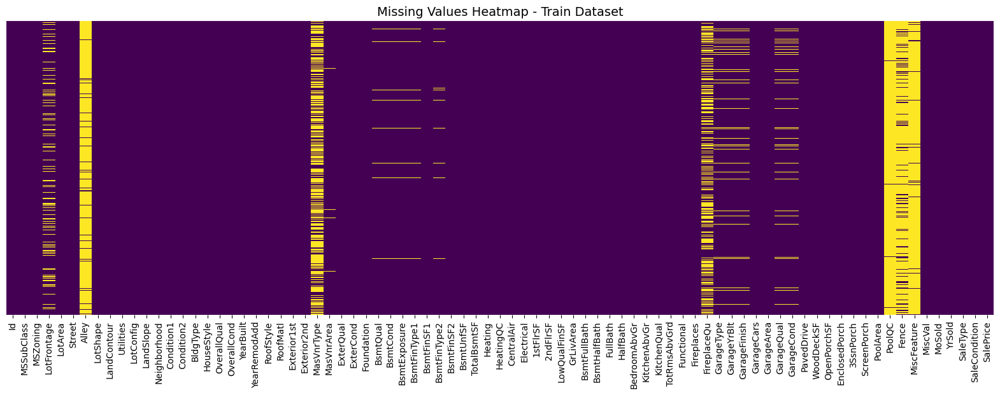

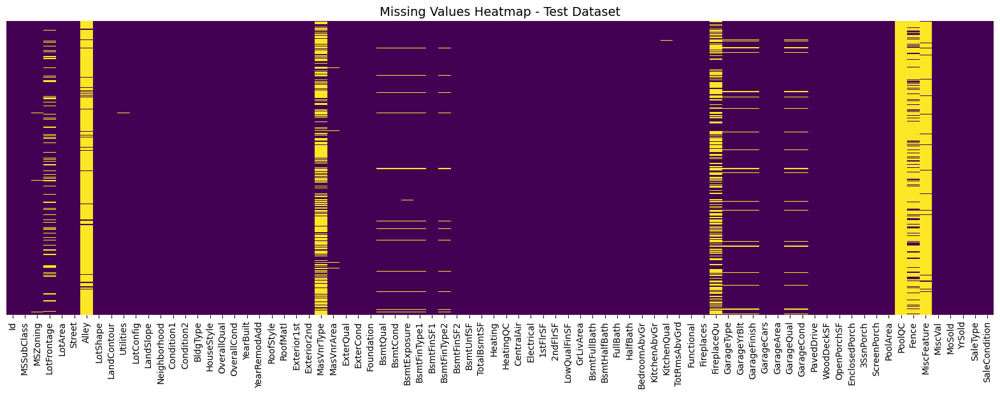

In [154]:
# Function to plot missing values heatmap
def plot_missing_values_heatmap(df, title="Missing Values Heatmap"):
    plt.figure(figsize=(20, 6))
    sns.heatmap(df.isnull(), cmap='viridis', cbar=False, yticklabels=False)
    plt.title(title, fontsize=14)
    plt.show()

# Generate heatmaps for train and test datasets
plot_missing_values_heatmap(train, "Missing Values Heatmap - Train Dataset")
plot_missing_values_heatmap(test, "Missing Values Heatmap - Test Dataset")


### Handling NaN values

In [155]:
# Fill missing values for the specified columns
train['LotFrontage'].fillna(0, inplace=True)
test['LotFrontage'].fillna(0, inplace=True)

train['MasVnrArea'].fillna(0, inplace=True)
test['MasVnrArea'].fillna(0, inplace=True)

# Fill missing categorical features with 'None'
categorical_features_to_fill_none = [
    'Alley', 'MasVnrType', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 
    'BsmtFinType1', 'BsmtFinType2', 'Electrical', 'FireplaceQu', 
    'GarageType', 'GarageYrBlt', 'GarageFinish', 'GarageQual', 
    'GarageCond', 'PoolQC', 'Fence', 'MiscFeature'
]

# Loop through the list and fill missing values with 'None'
for feature in categorical_features_to_fill_none:
    train[feature].fillna('None', inplace=True)
    test[feature].fillna('None', inplace=True)

Check duplicates

In [156]:
# Check for duplicates in train dataset
train_duplicates = train[train.duplicated()]
print("Duplicates in train dataset:")
print(train_duplicates)

# Check for duplicates in test dataset
test_duplicates = test[test.duplicated()]
print("\nDuplicates in test dataset:")
print(test_duplicates)


Duplicates in train dataset:
Empty DataFrame
Columns: [Id, MSSubClass, MSZoning, LotFrontage, LotArea, Street, Alley, LotShape, LandContour, Utilities, LotConfig, LandSlope, Neighborhood, Condition1, Condition2, BldgType, HouseStyle, OverallQual, OverallCond, YearBuilt, YearRemodAdd, RoofStyle, RoofMatl, Exterior1st, Exterior2nd, MasVnrType, MasVnrArea, ExterQual, ExterCond, Foundation, BsmtQual, BsmtCond, BsmtExposure, BsmtFinType1, BsmtFinSF1, BsmtFinType2, BsmtFinSF2, BsmtUnfSF, TotalBsmtSF, Heating, HeatingQC, CentralAir, Electrical, 1stFlrSF, 2ndFlrSF, LowQualFinSF, GrLivArea, BsmtFullBath, BsmtHalfBath, FullBath, HalfBath, BedroomAbvGr, KitchenAbvGr, KitchenQual, TotRmsAbvGrd, Functional, Fireplaces, FireplaceQu, GarageType, GarageYrBlt, GarageFinish, GarageCars, GarageArea, GarageQual, GarageCond, PavedDrive, WoodDeckSF, OpenPorchSF, EnclosedPorch, 3SsnPorch, ScreenPorch, PoolArea, PoolQC, Fence, MiscFeature, MiscVal, MoSold, YrSold, SaleType, SaleCondition, SalePrice]
Index: []

# Exploratory Data Analysis (EDA)

## Statistical analysis of quantitative features

In [157]:
print("train statistical analysis:")
display(train.drop(columns='Id', errors='ignore').describe())

print("test statistical analysis:")
display(train.drop(columns='Id', errors='ignore').describe())

train statistical analysis:


,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,56.897260,57.623288,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.117123,443.639726,46.549315,567.240411,1057.429452,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,6.517808,0.613014,1.767123,472.980137,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,42.300571,34.664304,9981.264932,1.382997,1.112799,30.202904,20.645407,180.731373,456.098091,161.319273,441.866955,438.705324,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,1.625393,0.644666,0.747315,213.804841,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,20.000000,0.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,20.000000,42.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,0.000000,0.000000,1129.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1.000000,334.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,50.000000,63.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,0.000000,0.000000,1464.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,70.000000,79.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,164.250000,712.250000,0.000000,808.000000,1298.250000,1391.250000,728.000000,0.000000,1776.750000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


test statistical analysis:


,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,56.897260,57.623288,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.117123,443.639726,46.549315,567.240411,1057.429452,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,6.517808,0.613014,1.767123,472.980137,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,42.300571,34.664304,9981.264932,1.382997,1.112799,30.202904,20.645407,180.731373,456.098091,161.319273,441.866955,438.705324,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,1.625393,0.644666,0.747315,213.804841,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,20.000000,0.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,20.000000,42.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,0.000000,0.000000,1129.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1.000000,334.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,50.000000,63.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,0.000000,0.000000,1464.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,70.000000,79.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,164.250000,712.250000,0.000000,808.000000,1298.250000,1391.250000,728.000000,0.000000,1776.750000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


**Feature-by-Feature Analysis:**

1. **MSSubClass**:
   - **Description**: The building class.
   - **Range**: From 20 (smallest building) to 190 (largest).
   - **Insight**: It’s an important feature that categorizes building types. The values provide insight into the overall size and style of houses.

2. **LotArea**:
   - **Description**: Lot size in square feet.
   - **Range**: From 1,300 to 215,245 square feet, with a mean of 10,507.81.
   - **Insight**: Shows significant variation. Larger homes tend to be on larger plots, which may influence the price. There might be outliers that should be examined further.

3. **OverallQual**:
   - **Description**: Overall quality of the house, rated on a scale from 1 (lowest) to 10 (highest).
   - **Range**: From 1 to 10, with a mean of 6.09.
   - **Insight**: This feature represents the general condition of the house. Most houses fall between ratings of 5-7, showing that average-quality homes are most common in the dataset.

4. **OverallCond**:
   - **Description**: Overall condition of the house, rated on a scale from 1 (lowest) to 9 (highest).
   - **Range**: From 1 to 9, with a mean of 5.58.
   - **Insight**: Similar to `OverallQual`, this feature assesses the condition of the house but is likely focused more on its physical upkeep and structure.

5. **YearBuilt**:
   - **Description**: Year the house was originally constructed.
   - **Range**: From 1872 to 2010, with a mean of 1971.
   - **Insight**: Houses are mostly from the 20th century, with a peak in the late 20th century. Older homes may require more maintenance, while newer homes may have better features and amenities.

6. **YearRemodAdd**:
   - **Description**: Year the house was last remodeled or added to.
   - **Range**: From 1950 to 2010, with a mean of 1984.76.
   - **Insight**: Shows when homes were last updated. It can help identify if a house is more modern or if it might need additional renovations.

7. **MasVnrArea**:
   - **Description**: Masonry veneer area in square feet (e.g., brick or stone exterior).
   - **Range**: From 0 to 1,600, with a mean of 103.76 square feet.
   - **Insight**: Some houses may not have any masonry veneer, as indicated by the 0 value. This feature may impact the aesthetic and value of the house.

8. **BsmtFinSF1, BsmtFinSF2**:
   - **Description**: Area of finished basement space, in square feet (two different sections of the basement).
   - **Range**: `BsmtFinSF1` ranges from 0 to 5,644 sq. ft., and `BsmtFinSF2` ranges from 0 to 1,474 sq. ft.
   - **Insight**: Basement space is valuable, especially in colder climates. These features show the size of the finished basement, which can add living space to the house.

9. **BsmtUnfSF**:
    - **Description**: Area of unfinished basement space in square feet.
    - **Range**: From 0 to 2,336 sq. ft.
    - **Insight**: Unfinished basements are common in older homes, and this feature can give insight into the potential for future renovations.

10. **TotalBsmtSF**:
    - **Description**: Total basement area (sum of finished and unfinished areas).
    - **Range**: From 0 to 6,110 sq. ft.
    - **Insight**: A larger basement area is often associated with larger homes, and it can significantly affect the price and livability.

11. **1stFlrSF**:
    - **Description**: Area of the first floor in square feet.
    - **Range**: From 334 to 4,692 sq. ft., with a mean of 1,056 sq. ft.
    - **Insight**: Indicates the primary living area of the home. Larger first-floor spaces often correlate with larger, more expensive homes.

12. **2ndFlrSF**:
    - **Description**: Area of the second floor in square feet.
    - **Range**: From 0 to 2,065 sq. ft., with a mean of 346.74 sq. ft.
    - **Insight**: Smaller than the first floor in most homes, but it can still add substantial living space to a multi-story house.

13. **LowQualFinSF**:
    - **Description**: Low-quality finished area in square feet.
    - **Range**: From 0 to 572 sq. ft.
    - **Insight**: Generally, this feature is 0 for most homes, indicating that high-quality finishes are more common in the dataset.

14. **GrLivArea**:
    - **Description**: Above-ground living area in square feet.
    - **Range**: From 334 to 5,642 sq. ft., with a mean of 1,514 sq. ft.
    - **Insight**: A key feature influencing house value; the more above-ground living space, the higher the potential price.

15. **BsmtFullBath, BsmtHalfBath**:
    - **Description**: Number of full and half bathrooms in the basement.
    - **Range**: `BsmtFullBath` from 0 to 3, and `BsmtHalfBath` from 0 to 2.
    - **Insight**: More bathrooms in the basement could add value, particularly in homes with fully finished basements.

16. **FullBath, HalfBath**:
    - **Description**: Number of full and half bathrooms above grade.
    - **Range**: `FullBath` from 0 to 3, and `HalfBath` from 0 to 2.
    - **Insight**: The number of bathrooms significantly impacts the house’s functionality and overall comfort.

17. **BedroomAbvGr**:
    - **Description**: Number of bedrooms above ground.
    - **Range**: From 1 to 8, with a mean of 2.87.
    - **Insight**: More bedrooms typically mean a larger house and higher price. The majority of houses in the dataset have 3–4 bedrooms.

18. **KitchenAbvGr**:
    - **Description**: Number of kitchens above ground.
    - **Range**: From 1 to 3.
    - **Insight**: Generally, houses have one kitchen, though larger homes may have multiple.

19. **TotRmsAbvGrd**:
    - **Description**: Total rooms above grade (excluding bathrooms).
    - **Range**: From 2 to 14, with a mean of 6.52.
    - **Insight**: More rooms correlate with larger, more expensive homes.

20. **Fireplaces**:
    - **Description**: Number of fireplaces in the house.
    - **Range**: From 0 to 3, with a mean of 0.61.
    - **Insight**: Not all houses have fireplaces, but their presence can increase the value and desirability of a property.

21. **GarageCars, GarageArea**:
    - **Description**: Number of cars the garage can hold and the area of the garage in square feet.
    - **Range**: `GarageCars` from 0 to 4, with a mean of 1.76, and `GarageArea` from 0 to 1,418 sq. ft., with a mean of 472.53.
    - **Insight**: Larger garages with higher car capacity are often associated with higher-priced homes.

22. **WoodDeckSF, OpenPorchSF, EnclosedPorch, 3SsnPorch, ScreenPorch**:
    - **Description**: Various porch and deck areas in square feet.
    - **Insight**: Homes with more outdoor space (decks, porches) may be valued higher, particularly in areas with good weather.

23. **PoolArea**:
    - **Description**: Pool area in square feet.
    - **Range**: From 0 to 1,500 sq. ft.
    - **Insight**: A pool can add significant value to a home, but it’s only present in a small number of homes.

24. **MiscVal**:
    - **Description**: Miscellaneous feature value.
    - **Insight**: This can represent additional features that don’t fit other categories.

27. **MoSold, YrSold**:
    - **Description**: Month and year of sale.
    - **Range**: `MoSold` from 1 to 12, and `YrSold` from 2006 to 2010.
    - **Insight**: The time of year and the economy may affect home prices, with certain months or years possibly showing higher sales prices.

27. **SalePrice**:
    - **Description**: Sale price of the house.
    - **Range**: From 34,900 to 755,000, with a mean of 180,624.10.
    - **Insight**: This is the target variable, and it is significantly influenced by factors like location, size, age, and condition of the home.

---

**Conclusion:**
The dataset contains a mix of categorical and continuous variables, each contributing to the value and appeal of a house. Features like `OverallQual`, `GrLivArea`, and `SalePrice` are likely to have the most significant impact on predicting house prices, while others like `BsmtFinSF1`, `Fireplaces`, and `GarageCars` could provide additional insight into the overall value and functionality of the house.

## Grapfics and summaries

### Define features

In [158]:
# Define categorical and numerical features
num_features = ['LotArea', 'LotFrontage', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 
                'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 
                'GrLivArea', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 
                'ScreenPorch', 'PoolArea', 'MiscVal', 'YearBuilt', 'YearRemodAdd', 'SalePrice']

cat_features = [column for column in train.columns if column not in num_features and column != 'Id']

print("\nnum_features:")
print(num_features)
print("\ncat_features:")
print(cat_features)


num_features:
['LotArea', 'LotFrontage', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'YearBuilt', 'YearRemodAdd', 'SalePrice']

cat_features:
['MSSubClass', 'MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'OverallQual', 'OverallCond', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType', 'GarageYrBlt', 'GarageFinish', 'GarageCars', '

In [159]:
# Function to plot histograms and boxplots for numeric features
def plot_numeric_features(train, test, num_features):
    for feature in num_features:
        # Set up the figure with two rows (one for histogram, one for boxplot)
        plt.figure(figsize=(14, 6))

        # Top plot: Histogram for the train set
        plt.subplot(2, 2, 1)
        sns.histplot(train[feature], kde=True)
        plt.title(f'Histogram of {feature} (Train)')

        # Bottom plot: Boxplot for the train set
        plt.subplot(2, 2, 3)
        sns.boxplot(x=train[feature], color='lightblue', fliersize=3, width=0.5)
        plt.title(f'Boxplot of {feature} (Train)')

        # Top plot: Histogram for the test set
        if feature in test.columns:
            plt.subplot(2, 2, 2)
            sns.histplot(test[feature], kde=True)
            plt.title(f'Histogram of {feature} (Test)')

        # Bottom plot: Boxplot for the test set
        if feature in test.columns:
            plt.subplot(2, 2, 4)
            sns.boxplot(x=test[feature], color='lightgreen', fliersize=3, width=0.5)
            plt.title(f'Boxplot of {feature} (Test)')

        plt.tight_layout()
        plt.show()

# Function to plot bar charts for categorical features
def plot_categorical_features(train, test, cat_features):
    for feature in cat_features:
        # Set up the figure with two rows (one for train, one for test)
        plt.figure(figsize=(14, 6))

        # Top plot: Bar chart for the train set
        plt.subplot(2, 2, 1)
        sns.countplot(y=train[feature], palette='viridis')
        plt.title(f'Bar chart of {feature} (Train)')

        # Bottom plot: Bar chart for the test set
        if feature in test.columns:
            plt.subplot(2, 2, 2)
            sns.countplot(y=test[feature], palette='viridis')
            plt.title(f'Bar chart of {feature} (Test)')

        plt.tight_layout()
        plt.show()

### Plot numerical features

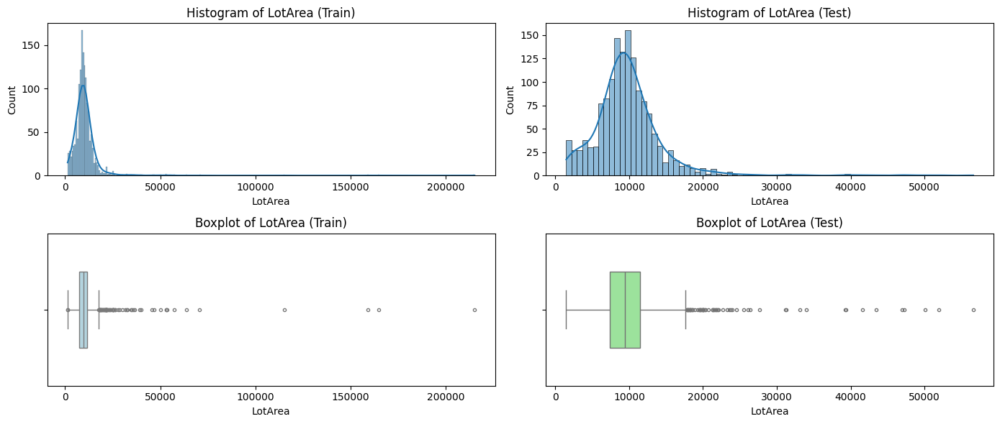

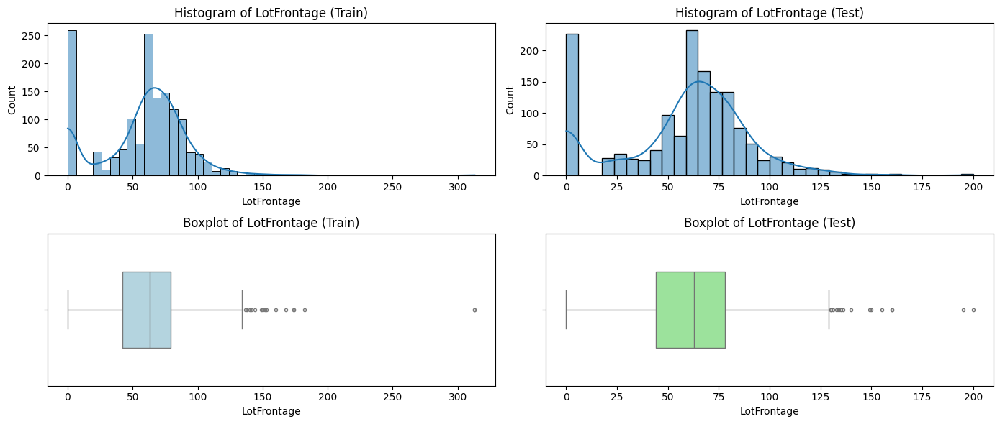

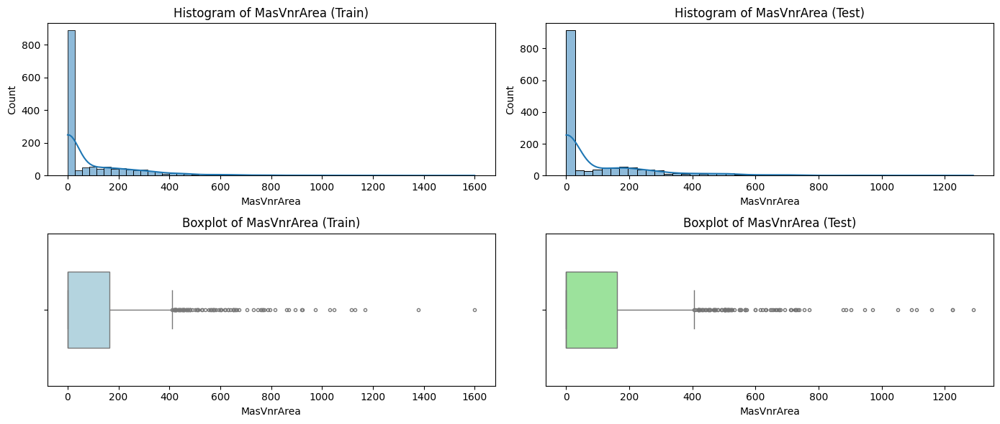

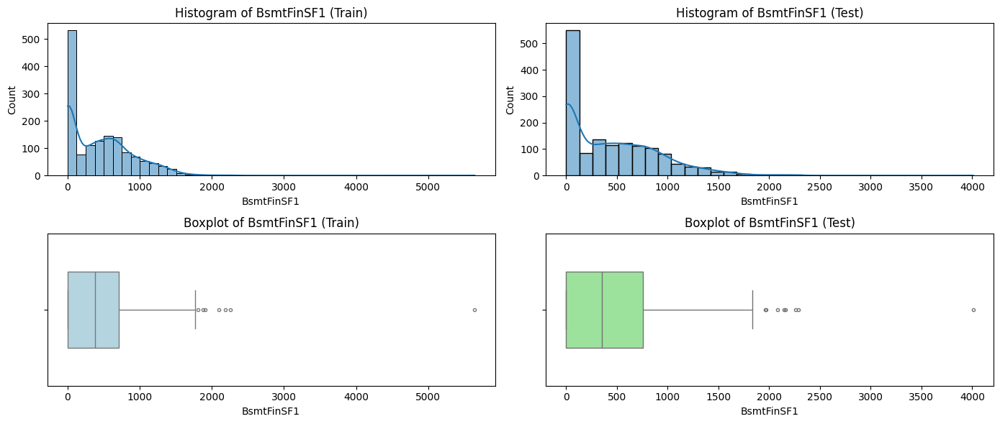

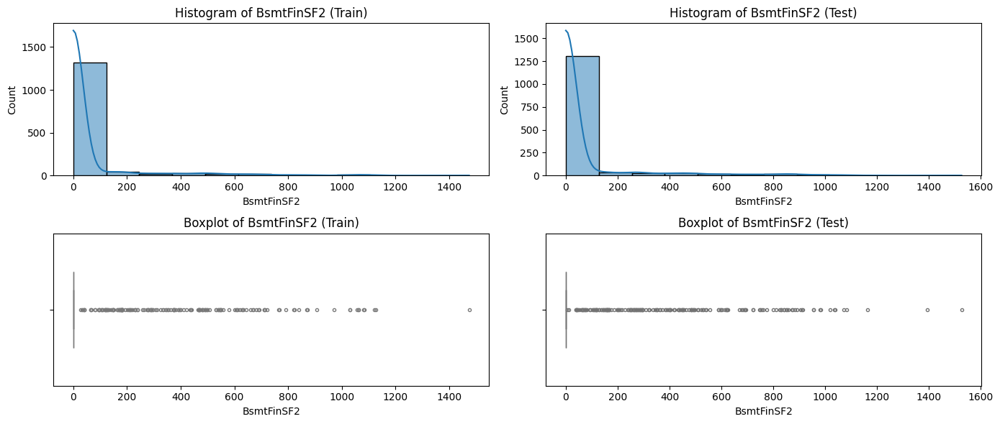

...

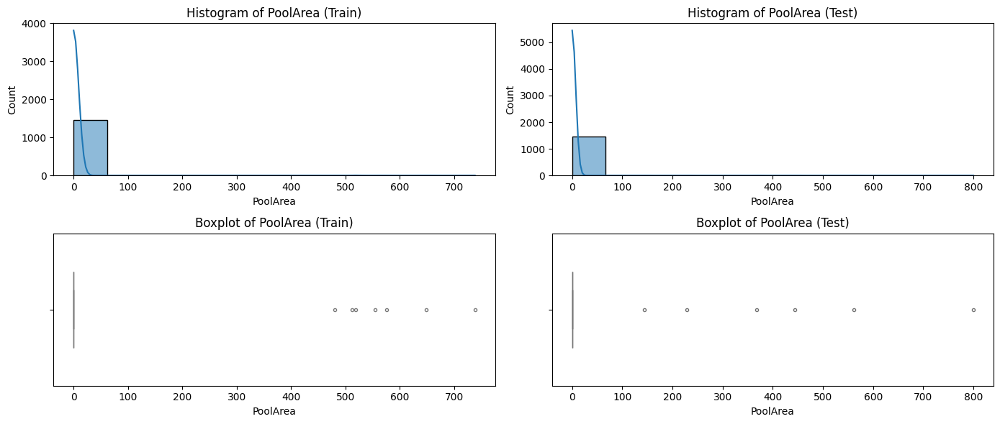

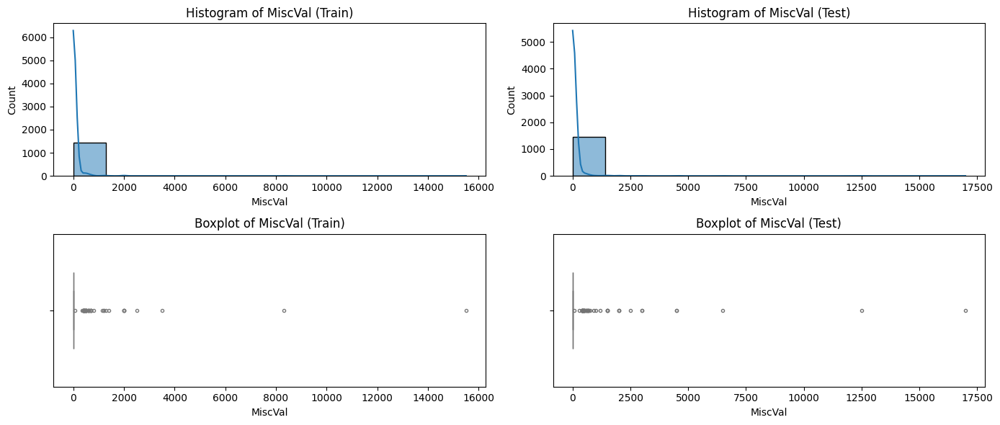

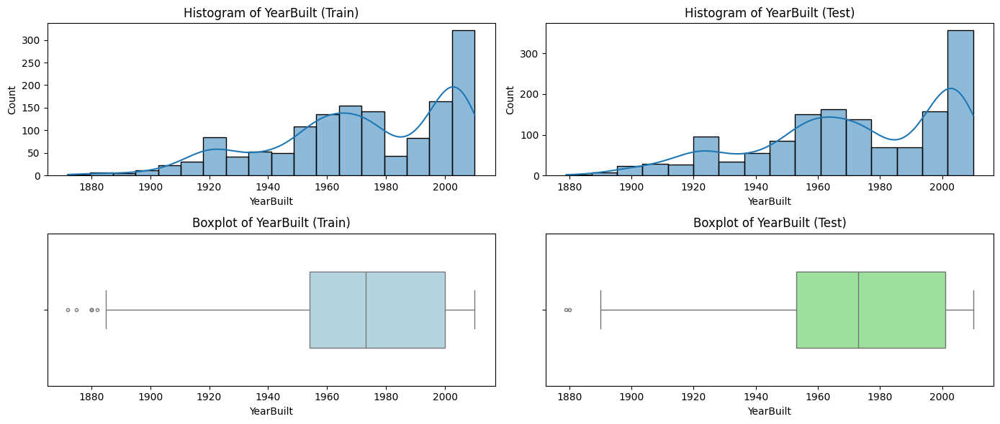

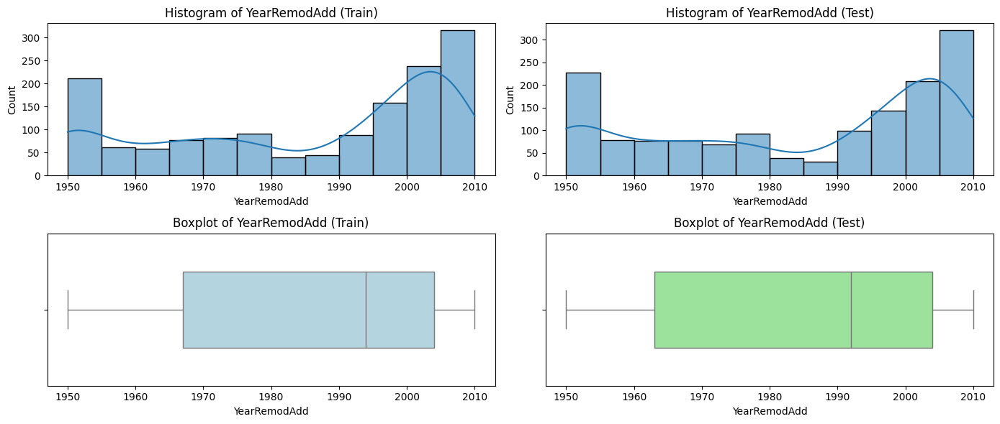

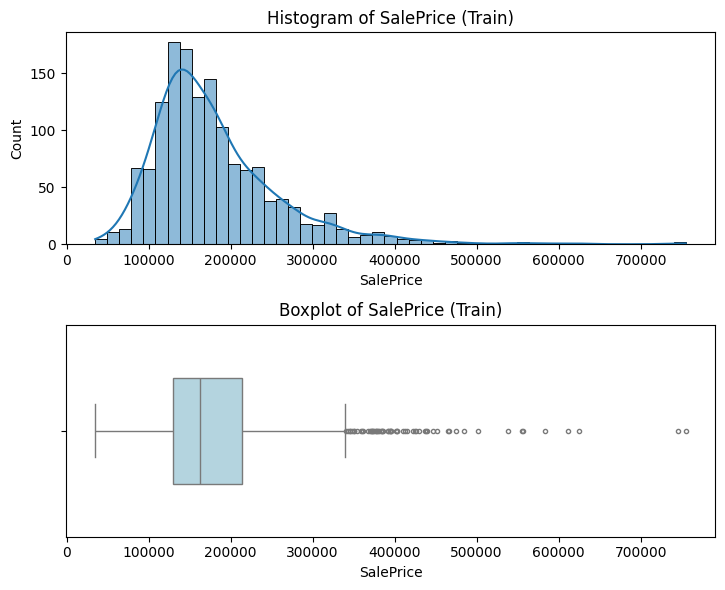

In [160]:
plot_numeric_features(train, test, num_features)  # Plot numeric features

### Log transform

In [161]:
def log_transform_num_features(train: pd.DataFrame):
    # Log transformation of features, with a small shift (e.g., +1) to avoid log of zero or negative values
    for feature in [col for col in num_features if col not in ['SalePrice', '3SsnPorch', 'MiscVal']]:
        train[feature] = np.log1p(train[feature])  # np.log1p computes log(1 + x) to avoid zero issues
    
    return train

# Apply the function to the train dataset
train_log_transformed = log_transform_num_features(train)

# Check the results
train_log_transformed.head()


,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,4.189655,9.042040,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,7.602900,7.602900,Gable,CompShg,VinylSd,VinylSd,BrkFace,5.283204,Gd,TA,PConc,Gd,TA,No,GLQ,6.561031,Unf,0.0,5.017280,6.753438,GasA,Ex,Y,SBrkr,6.753438,6.751101,0.0,7.444833,1,0,2,1,3,1,Gd,8,Typ,0,None,Attchd,2003.0,RFn,2,6.308098,TA,TA,Y,0.000000,4.127134,0.000000,0,0.0,0.0,None,None,None,0,2,2008,WD,Normal,208500
1,2,20,RL,4.394449,9.169623,Pave,None,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,7.589336,7.589336,Gable,CompShg,MetalSd,MetalSd,None,0.000000,TA,TA,CBlock,Gd,TA,Gd,ALQ,6.886532,Unf,0.0,5.652489,7.141245,GasA,Ex,Y,SBrkr,7.141245,0.000000,0.0,7.141245,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,6.133398,TA,TA,Y,5.700444,0.000000,0.000000,0,0.0,0.0,None,None,None,0,5,2007,WD,Normal,181500
2,3,60,RL,4.234107,9.328212,Pave,None,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,7.601902,7.602401,Gable,CompShg,VinylSd,VinylSd,BrkFace,5.093750,Gd,TA,PConc,Gd,TA,Mn,GLQ,6.188264,Unf,0.0,6.075346,6.825460,GasA,Ex,Y,SBrkr,6.825460,6.765039,0.0,7.488294,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,6.411818,TA,TA,Y,0.000000,3.761200,0.000000,0,0.0,0.0,None,None,None,0,9,2008,WD,Normal,223500
3,4,70,RL,4.110874,9.164401,Pave,None,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,7.557995,7.586296,Gable,CompShg,Wd Sdng,Wd Shng,None,0.000000,TA,TA,BrkTil,TA,Gd,No,ALQ,5.379897,Unf,0.0,6.293419,6.629363,GasA,Gd,Y,SBrkr,6.869014,6.629363,0.0,7.448916,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,6.466145,TA,TA,Y,0.000000,3.583519,5.609472,0,0.0,0.0,None,None,None,0,2,2006,WD,Abnorml,140000
4,5,60,RL,4.442651,9.565284,Pave,None,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,7.601402,7.601402,Gable,CompShg,VinylSd,VinylSd,BrkFace,5.860786,Gd,TA,PConc,Gd,TA,Av,GLQ,6.486161,Unf,0.0,6.196444,7.044033,GasA,Ex,Y,SBrkr,7.044033,6.960348,0.0,7.695758,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,6.729824,TA,TA,Y,5.262690,4.442651,0.000000,0,0.0,0.0,None,None,None,0,12,2008,WD,Normal,250000


### **Conclusions on Quantitative Features Based on Transformations and Analysis:**

**1. General Observations:**
- **Most features are not normally distributed**, which may impact machine learning models' performance.
- **Outliers** were detected in several features, including `TotalBsmtSF`, `1stFlrSF`, `GrLivArea`, `GarageArea`, and `SalePrice`.
- Some features contain **a cluster of zero values**, suggesting a categorical representation might be beneficial (e.g., `GarageArea`, `TotalBsmtSF`).

---

**2. Analysis of Individual Features:**

**Year-based Features**
- **`YearBuilt` (Year the house was built)**:  
  - The majority of houses were built **from 1990 onwards**.
  - The second most common range is **1945-1980**.
  - Houses built **before 1945** are less frequent.
  - The oldest houses (pre-1900) are **extremely rare**.

- **`YearRemodAdd` (Year of remodeling/renovation)**:  
  - A significant number of houses were **remodeled in 1950**.
  - Most renovations occurred **between 1990 and 2010**.
  - A **small peak around 1977**.
  - Other years appear **less frequently**.

**Area-related Features**
- **`TotalBsmtSF` (Total basement area) and `1stFlrSF` (First floor area)**:  
  - The majority of values fall **between 0 and 2000 sq. ft**.
  - **Values above 3200 sq. ft are considered outliers**.

- **`GrLivArea` (Above-ground living area)**:  
  - Most data points are within **0-2800 sq. ft**.
  - **Values exceeding 2800 sq. ft are classified as outliers**.

- **`GarageArea` (Garage area size)**:  
  - **A significant number of homes have no garage** (value = 0).
  - Most garages range between **180 and 880 sq. ft**.
  - **Garage areas above 880 sq. ft are outliers**.

**Sale Date Features**
- **`MoSold` (Month Sold) and `YrSold` (Year Sold)**:  
  - **No detected outliers**.
  - Sales are **evenly distributed across years and months**.

**Target Variable**
- **`SalePrice` (Sale price of the house)**:  
  - Most houses are sold within the range of **0 to 340,000 dollars**.
  - **Values above 340,000 are considered outliers**.

---

### Plot categorical features

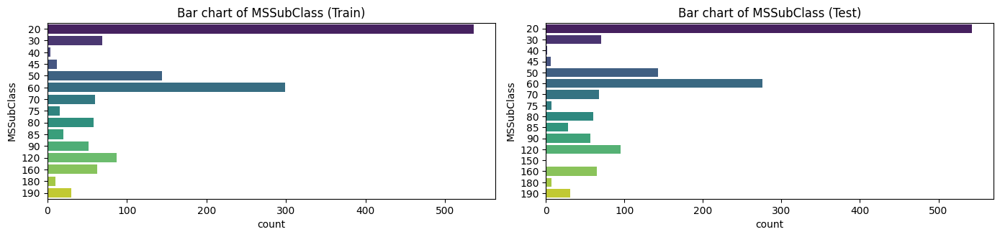

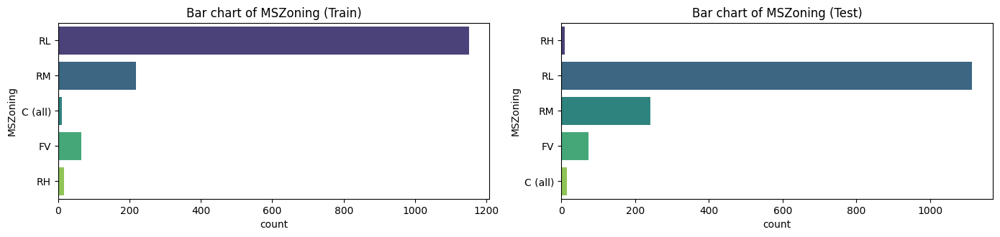

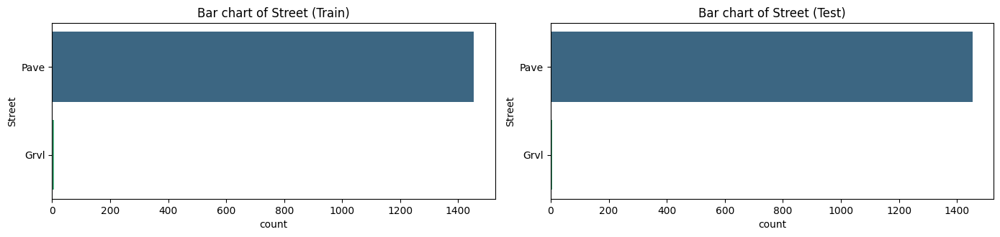

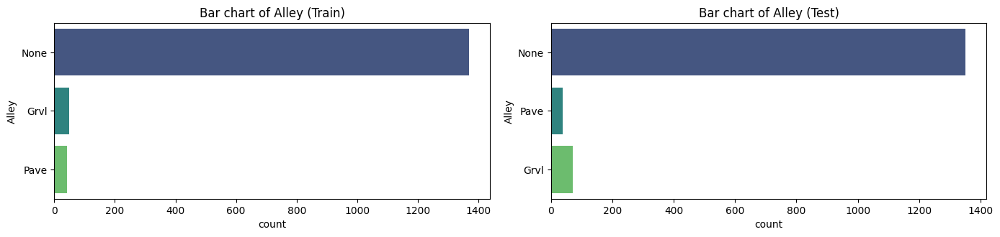

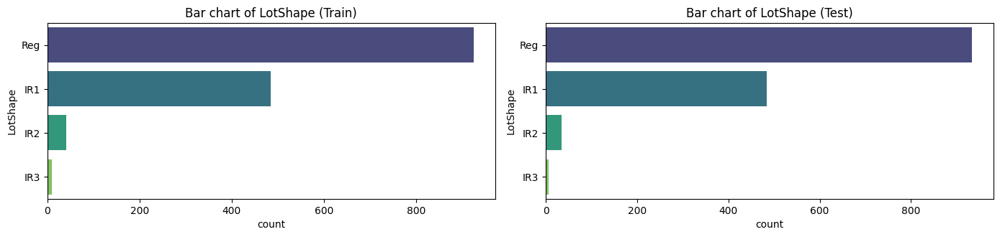

...

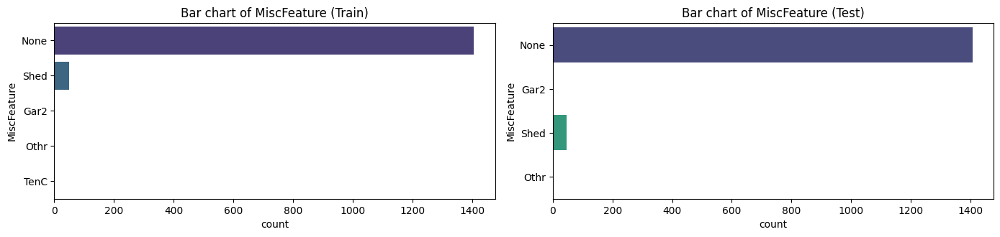

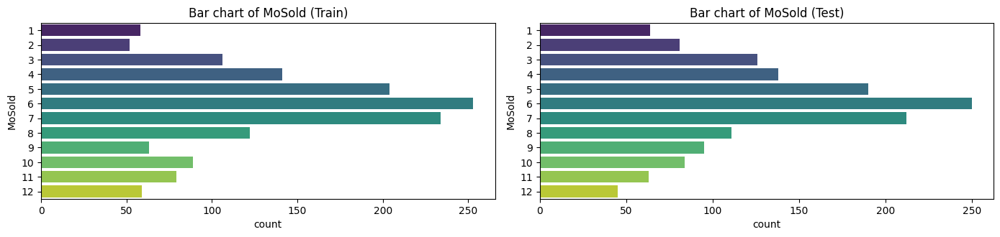

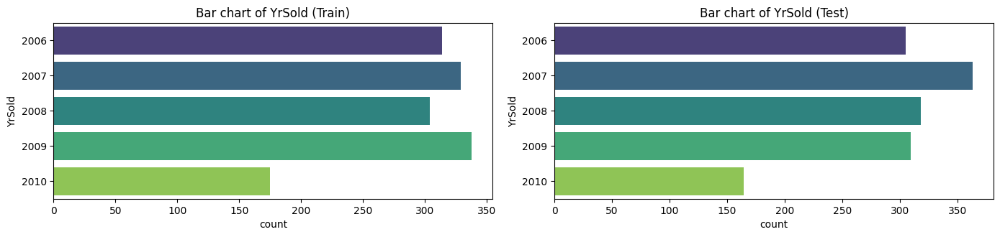

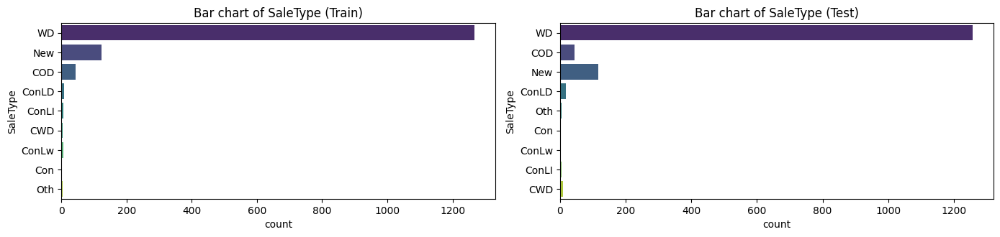

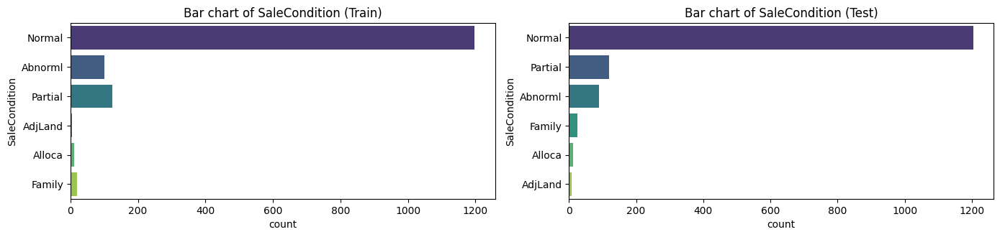

In [162]:
plot_categorical_features(train, test, cat_features)  # Plot categorical features

### **Categorical Feature Analysis & Insights**

**1. LandSlope**
- The majority of properties (~95%) have a gentle slope (`Gtl`).
- Very few properties have a steep slope (`Sev`), and even fewer in the test set.

**2. HouseStyle**
- `1Story` and `2Story` are dominant (~80% of homes).
- Rare styles such as `2.5Fin`, `2.5Unf`, and `1.5Unf` have very few occurrences, making them difficult for predictive modeling.

**3. EnclosedPorch_Bin**
- Most houses (~86%) have no enclosed porch (`Bin = 0`).
- Higher bins (`Bin = 3`) account for just ~1%, suggesting that enclosed porches are relatively rare.

**4. Functional**
- Over 90% of homes are classified as `Typ` (Typical Functionality).
- Only one home in the train set is categorized as `Sev` (Severely damaged), making it an extreme outlier.

**5. BsmtUnfSF_Bin**
- This feature is well distributed across bins, with the highest concentration in `Bin = 1`.

**6. Heating**
- `GasA` (Gas heating) is overwhelmingly dominant (~97% of all homes).
- Other types (`GasW`, `Grav`, `Wall`, `Floor`, `OthW`) appear in tiny proportions and may not significantly impact predictions.

**7. RoofStyle**
- Most homes have `Gable` (~75%) or `Hip` (~20%) roofs.
- Other styles (`Flat`, `Gambrel`, `Mansard`, `Shed`) are rare, possibly making them less influential features.

**8. 2ndFlrSF_Bin**
- Over half of the houses (~57%) have no second floor (`Bin = 0`).
- Houses with significant second-floor space (`Bin = 4`) are relatively rare.

**9. LotShape**
- `Reg` (Regular) shape dominates (~70%).
- Irregular shapes (`IR1`, `IR2`, `IR3`) are relatively less common but might indicate larger or uniquely shaped lots.

**10. Exterior1st**
- Vinyl Siding (`VinylSd`), Metal (`MetalSd`), Hardboard (`HdBoard`), and Wood (`Wd Sdng`) are the most frequent materials.
- `Stone`, `CBlock`, and `ImStucc` are extremely rare, making them potential noise factors in modeling.

**11. BsmtFinSF1_Bin**
- The data is clustered into a few key bins, with `Bin = 3` being the most common.
- There is a balance across multiple bins, making it a potentially useful feature.

**12. Has_MiscVal**
- Most homes (~96%) have no miscellaneous value (`0`).
- A small percentage (`4%`) have a nonzero value, indicating extra costs for additions such as sheds or minor upgrades.

**13. GarageQual**
- Over 90% of garages are rated as `TA` (Typical/Average).
- Very few garages are rated `Po` (Poor), `Ex` (Excellent), or `Gd` (Good), making these categories less useful.

**14. ExterCond**
- `TA` (Typical) is the dominant category (~87%).
- Extreme cases (`Ex` - Excellent, `Po` - Poor) are rare.

**15. Neighborhood**
- `NAmes` (North Ames), `OldTown`, and `CollgCr` (College Creek) are the most common neighborhoods.
- Some neighborhoods such as `Blueste` and `NPkVill` are underrepresented, making them less reliable for predictions.

**16. MasVnrArea_Bin**
- About 60% of houses fall into `Bin=0` (No Masonry).
- Masonry veneer area does vary, with moderate counts in `Bin = 2, 3, 4`, but the highest bins are less common.

**17. OpenPorchSF_Bin**
- The distribution across bins is fairly balanced, suggesting it might be useful in predictive modeling.

**18. PoolQC**
- 99% of houses have `None` (No pool).
- Only a handful of homes have pools (`Ex`, `Gd`, `Fa` categories), making this feature unlikely to be useful unless aggregated into `Has_Pool`.

**19. BsmtFinSF2_Bin**
- Over 85% of homes fall into `Bin = 0`, indicating that most homes do not have a second finished basement.
- Higher bins are relatively rare.

**20. SaleType**
- `WD` (Warranty Deed) is the dominant sale type (~87%).
- `New` homes account for ~10%, while other sale types are much less frequent.

**21. SaleCondition**
- `Normal` sales account for ~80%.
- `Partial` (new construction) is significant (~10%).
- `Abnorml` (Abnormal Sale) is present in ~6% of cases.

**22. BsmtQual**
- `TA` and `Gd` dominate (~90%), indicating most basements have typical or good quality.
- `Ex` (Excellent) is less common but may indicate premium homes.

**23. GarageCond**
- Follows a similar trend to `GarageQual`, with `TA` being the dominant category.

**24. Foundation**
- Poured Concrete (`PConc`) and Cinder Block (`CBlock`) are the most common (~85%).
- `Wood` and `Stone` foundations are rare.

**25. Electrical**
- `SBrkr` (Standard Breaker) dominates (~95%).
- Other types (`FuseA`, `FuseF`, `Mix`) appear in very small numbers.

**26. OverallQual**
- Houses are most commonly rated `5`, `6`, or `7`, which suggests the majority have average to above-average quality.
- Very few homes have extreme quality ratings (`1`, `2`, `10`).

**27. BldgType**
- `1Fam` (Single-Family Home) dominates (~85%).
- Townhouses (`Twnhs`, `TwnhsE`) and Duplexes (`2fmCon`) are significantly less frequent.

**28. Exterior2nd**
- Follows a similar pattern as `Exterior1st`, with Vinyl, Metal, and Wood being dominant.

**29. Condition1 / Condition2**
- `Norm` (Normal) is overwhelmingly dominant (~85%).
- Unusual conditions such as `Artery`, `Feedr`, `PosN`, and `RRAe` appear in small numbers.

**30. OverallCond**
- Most homes fall into `5`, `6`, or `7`.
- Extreme conditions (`1`, `2`, `9`) are rare.

**31. PavedDrive**
- Mostly `Y` (Paved Driveway).

**32. LotArea_Bin**
- The bin distribution is well spread, suggesting it may be useful in predicting price.

**33. Fence**
- `None` is dominant (~80%), meaning most homes do not have a fenced yard.
- The few cases of `MnPrv`, `GdPrv`, and `GdWo` indicate partial or good wooden privacy fences.

**34. Has_Garage**
- Over 95% of homes have a garage.

**35. Has_Basement**
- Almost all homes (~98%) have a basement, making it redundant unless combined with other basement-related features.

**36. Has_Pool**
- Only a few homes (~0.5%) have pools, making it a highly skewed feature.

**Key Takeaways**
- **Dominant Categories**: Many categorical variables have a dominant category that accounts for over 90% of the data (e.g., `GasA` for Heating, `SBrkr` for Electrical, `PConc` for Foundation). These features might not be very useful unless combined with other information.
- **Highly Skewed Features**: Features like `PoolQC`, `MiscVal`, `GarageCond`, and `BsmtFinSF2` have very few occurrences outside their dominant category, meaning they might not contribute much predictive power.
- **Well-Distributed Features**: Variables like `Neighborhood`, `OverallQual`, and `LotArea_Bin` are well-distributed, making them strong candidates for feature importance.
- **Redundant Features**: Some binary features (`Has_Basement`, `Has_Garage`) may not add much value since their parent features already indicate the same information.

In [163]:
# num_features = [col for col in num_features if col != 'SalePrice']

# def scatter_plots(train: pd.DataFrame):
#     # List of features
#     target_column = 'SalePrice'  # Target
    
#     # СCreate plots
#     fig, axes = plt.subplots(nrows=len(num_features), ncols=1, figsize=(10, 5 * len(num_features)))
    
#     if len(num_features) == 1:
#         axes = [axes]
    
#     # Scatter plot
#     for i, feature in enumerate(num_features):
#         axes[i].scatter(train[feature], train[target_column], alpha=0.5)
#         axes[i].set_xlabel(feature)
#         axes[i].set_ylabel(target_column)
#         axes[i].set_title(f'{feature} vs {target_column}')
    
#     # Adjust layout for better visualization
#     plt.tight_layout()
#     plt.show()

# scatter_plots(train)

## Correlation analysis

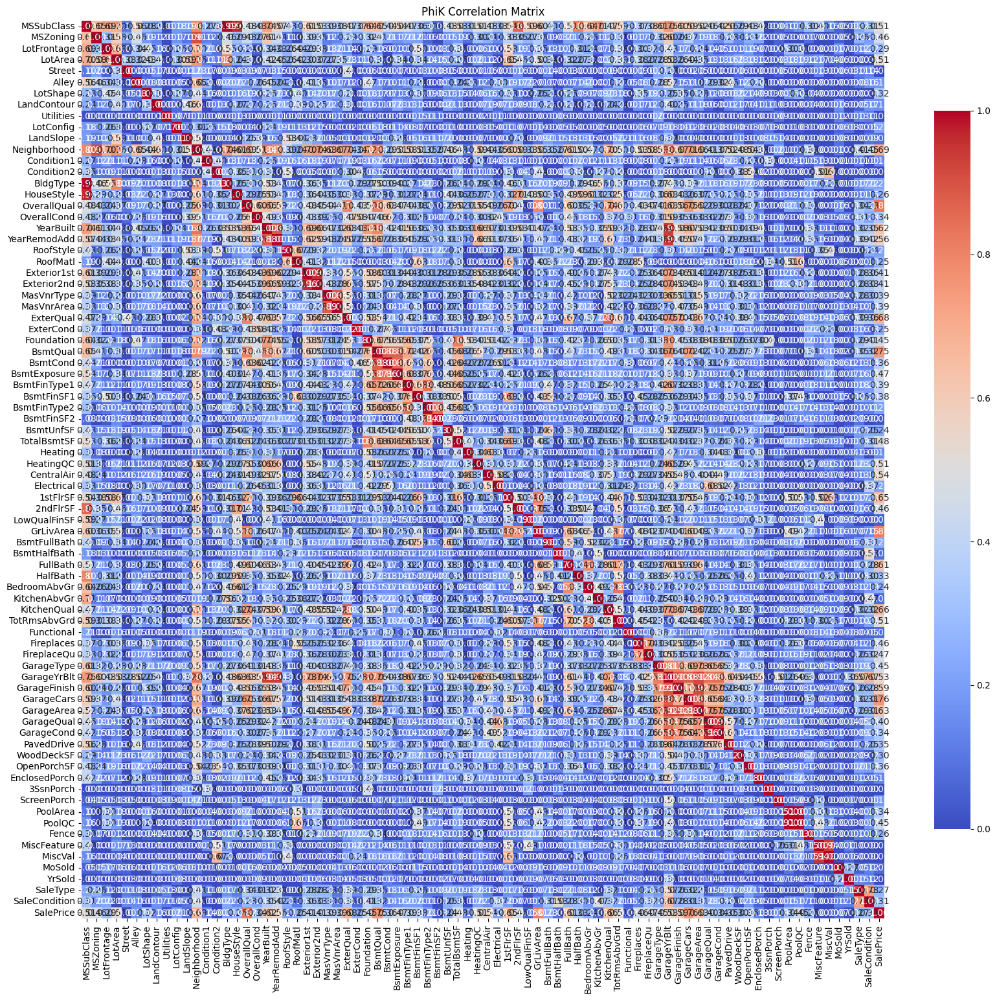

Highly Correlated Features (PhiK > 0.9):
         feature_1     feature_2  phi_k_value
14      MSSubClass      BldgType     0.994497
15      MSSubClass    HouseStyle     0.963013
91        MSZoning  Neighborhood     0.909032
881   Neighborhood      MSZoning     0.909032
1120      BldgType    MSSubClass     0.994497
1200    HouseStyle    MSSubClass     0.963013
1498     YearBuilt   GarageYrBlt     0.936073
1578  YearRemodAdd   GarageYrBlt     0.937946
1783   Exterior1st   Exterior2nd     0.959668
1862   Exterior2nd   Exterior1st     0.959668
4658   GarageYrBlt     YearBuilt     0.936073
4659   GarageYrBlt  YearRemodAdd     0.937946
4701   GarageYrBlt    GarageArea     0.917963
4781  GarageFinish    GarageArea     0.916672
4938    GarageArea   GarageYrBlt     0.917963
4939    GarageArea  GarageFinish     0.916672
5023    GarageQual    GarageCond     0.960122
5102    GarageCond    GarageQual     0.960122
5671      PoolArea        PoolQC     1.000000
5750        PoolQC      PoolArea     1.

In [164]:
# Select all columns except the 'ID' column for correlation analysis
# Assuming 'ID' is the name of the column with the identifier
features_for_phik = [col for col in train.columns if col.lower() != 'id']
continuous_columns = num_features

# Compute PhiK correlation matrix for train dataset
phik_corr = train[features_for_phik].phik_matrix(interval_cols=continuous_columns)

# Visualize the PhiK correlation matrix
plt.figure(figsize=(20, 18))
sns.heatmap(phik_corr, annot=True, fmt=".2f", cmap="coolwarm", cbar_kws={"shrink": 0.8})
plt.title("PhiK Correlation Matrix")
plt.show()

# Filter correlations greater than 0.9, excluding self-correlations
high_corr = phik_corr.stack().reset_index()
high_corr.columns = ['feature_1', 'feature_2', 'phi_k_value']
high_corr = high_corr[(high_corr['phi_k_value'] > 0.9) & (high_corr['feature_1'] != high_corr['feature_2'])]

# Display highly correlated feature pairs
print("Highly Correlated Features (PhiK > 0.9):")
print(high_corr)

# pd.options.display.max_rows = 9999
# display(phik_corr)

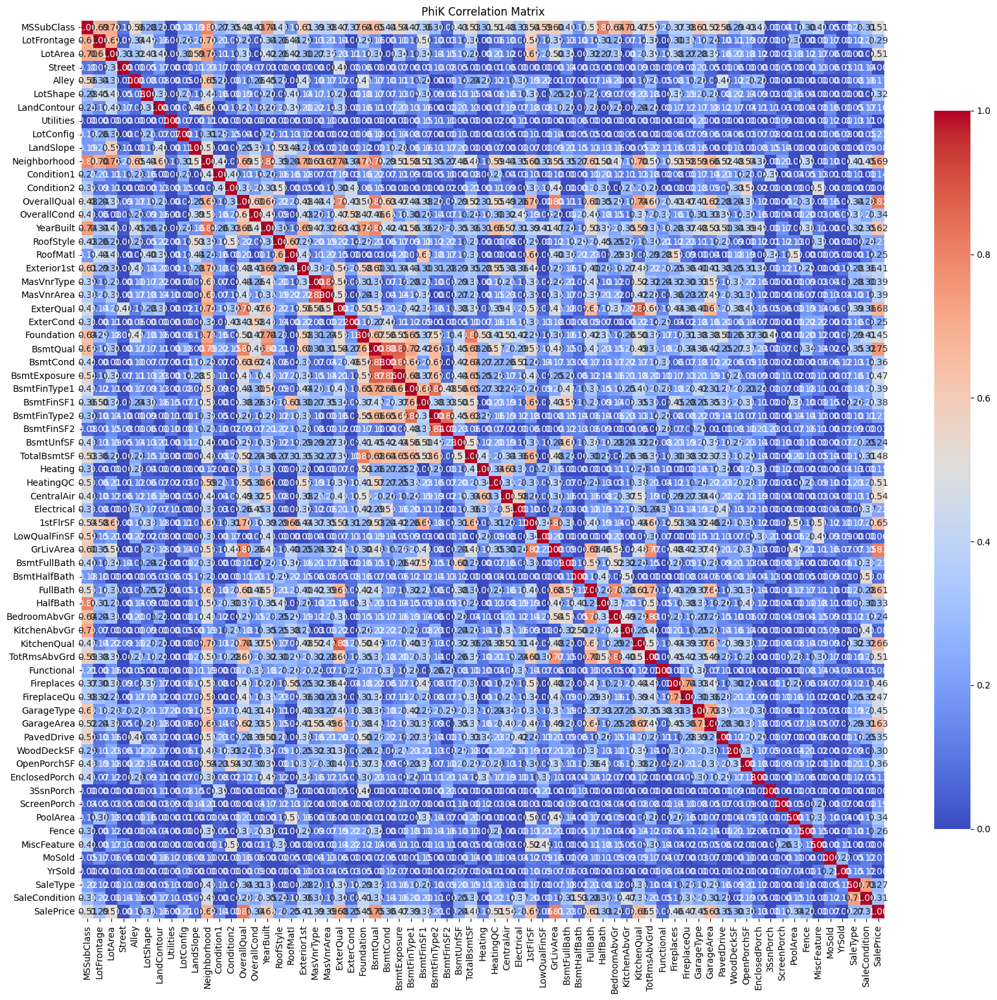

Highly Correlated Features (PhiK > 0.9):
Empty DataFrame
Columns: [feature_1, feature_2, phi_k_value]
Index: []


In [165]:
# List of highly correlated features to drop one
to_drop = ['BldgType', 'HouseStyle', 'MSZoning', 'YearRemodAdd', 'GarageYrBlt', 'Exterior2nd', '2ndFlrSF', 'GarageCars', 'GarageQual', 'GarageCond', 'MiscVal', 'GarageFinish', 'PoolQC']

features_for_phik = [col for col in train.columns if col.lower() != 'id' and col not in to_drop]
continuous_columns = num_features

# Compute PhiK correlation matrix for train dataset
phik_corr = train[features_for_phik].phik_matrix(interval_cols=continuous_columns)

# Visualize the PhiK correlation matrix
plt.figure(figsize=(20, 18))
sns.heatmap(phik_corr, annot=True, fmt=".2f", cmap="coolwarm", cbar_kws={"shrink": 0.8})
plt.title("PhiK Correlation Matrix")
plt.show()

# Filter correlations greater than 0.9, excluding self-correlations
high_corr = phik_corr.stack().reset_index()
high_corr.columns = ['feature_1', 'feature_2', 'phi_k_value']
high_corr = high_corr[(high_corr['phi_k_value'] > 0.9) & (high_corr['feature_1'] != high_corr['feature_2'])]

# Display highly correlated feature pairs
print("Highly Correlated Features (PhiK > 0.9):")
print(high_corr)

# pd.options.display.max_rows = 9999
# display(phik_corr)

# Pipeline preparation & models learning

### Create train & test sets

In [166]:
# Remove specified columns from cat_features
cat_features = [feature for feature in cat_features if feature not in [
    'BldgType', 'RoofStyle', 'Alley', 'OverallCond',
    'RoofMatl', 'GarageYrBlt', 'Electrical', 'Street', 
    'BsmtHalfBath', 'RoofStyle', 'LandSlope',
    'MiscFeature', 'Functional', 'Condition2', 'OverallQual',
    'PoolQC', 'BsmtFinType2', 'Utilities',
]]

# Define columns to drop
drop_columns = [
    'Id', 'BldgType', 'RoofStyle', 'Alley', 'OverallCond',
    'RoofMatl', 'GarageYrBlt', 'Electrical', 'Street', 
    'BsmtHalfBath', 'RoofStyle', 'LandSlope',
    'MiscFeature', 'Functional', 'Condition2', 'OverallQual',
    'PoolQC', 'BsmtFinType2', 'Utilities',
]

# Create feature sets
X_train = train.drop(columns=['SalePrice'] + drop_columns)
y_train = train['SalePrice']
X_test = test.drop(columns=drop_columns)

### Create pipelines

In [167]:
# Define ordinal features (ordered categorical variables)
ordinal_features = [
    # 'OverallQual', 'OverallCond', 
    'ExterQual', 'ExterCond', 'HeatingQC', 'KitchenQual', 
]

# Define nominal features (non-ordered categorical variables)
ohe_features = [col for col in cat_features if col not in ordinal_features]  # Nominal categorical variables

# numerical_features = [col for col in num_features if col != 'SalePrice']
numerical_features = [col for col in num_features if col not in ['SalePrice', '3SsnPorch', 'MiscVal']]

In [168]:
def convert_columns_to_string(X, features):
    X[features] = X[features].apply(lambda col: col.astype(str))
    return X

# Применяем к ohe_features
X_train = convert_columns_to_string(X_train, ohe_features)
X_test = convert_columns_to_string(X_test, ohe_features)

In [169]:
# Ordinal categories mapping (for each feature separately)
ordinal_categories = [
    # ["1", "2", "3", "4", "5", "6", "7", "8", "9", "10"],  # OverallQual
    # ["1", "2", "3", "4", "5", "6", "7", "8", "9", "10"],  # OverallCond
    ['Po', 'Fa', 'TA', 'Gd', 'Ex'],  # ExterQual
    ['Po', 'Fa', 'TA', 'Gd', 'Ex'],  # ExterCond
    ['Po', 'Fa', 'TA', 'Gd', 'Ex'],  # HeatingQC
    ['Po', 'Fa', 'TA', 'Gd', 'Ex'],  # KitchenQual
]

# Pipelines
ordinal_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy="most_frequent")),
    ('encoder', OrdinalEncoder(categories=ordinal_categories, handle_unknown='use_encoded_value', unknown_value=np.nan))
])

ohe_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy="most_frequent")),
    ('encoder', OneHotEncoder(drop='first', handle_unknown='ignore', sparse_output=False))
])

numerical_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy="mean")),
    ('scaler', StandardScaler())
])

# ColumnTransformer
preprocessor = ColumnTransformer([
    ('ord', ordinal_pipeline, ordinal_features),
    ('ohe', ohe_pipeline, ohe_features),
    ('num', numerical_pipeline, numerical_features)
], remainder='drop')


In [170]:
# Define models for hyperparameter tuning
models = [
    ('DecisionTree', DecisionTreeRegressor(random_state=RANDOM_STATE)),
    ('RandomForest', RandomForestRegressor(random_state=RANDOM_STATE)),
    ('XGBoost', XGBRegressor(random_state=RANDOM_STATE)),
    # ('LightGBM', LGBMRegressor(random_state=RANDOM_STATE))
]

In [171]:
# Hyperparameter grid for model tuning
param_grid = [
    # Decision Tree
    {
        'model': [DecisionTreeRegressor(random_state=RANDOM_STATE)],
        'model__max_depth': range(5, 50), 
        'model__min_samples_split': range(2, 20), 
        'model__min_samples_leaf': range(1, 20), 
        'preprocessor__num': [StandardScaler()]
    },

    # Random Forest
    {
        'model': [RandomForestRegressor(random_state=RANDOM_STATE)],
        'model__n_estimators': [50, 100, 200],
        'model__max_depth': [None, 10, 20, 30],
        'model__min_samples_split': [2, 5, 10],
        'model__min_samples_leaf': [1, 2, 4],
        'preprocessor__num': [StandardScaler()]
    },

    # XGBoost
    {
        'model': [XGBRegressor(random_state=RANDOM_STATE)],
        'model__n_estimators': range(50, 1000),
        'model__max_depth': range(3, 20),
        'model__learning_rate': [0.01, 0.05, 0.1, 0.2],
        'model__subsample': [0.8, 0.9, 1.0],
        'preprocessor__num': [StandardScaler()]
    },

    # # LightGBM
    # {
    #     'model': [LGBMRegressor(random_state=RANDOM_STATE)],
    #     'model__n_estimators': [50, 100, 200],
    #     'model__max_depth': [-1, 10, 20],  # -1 means no limit
    #     'model__learning_rate': [0.01, 0.05, 0.1],
    #     'model__num_leaves': [31, 50, 100],
    #     'model__min_child_samples': [20, 30],  # Добавлен параметр для минимального количества примеров в листе
    #     'model__subsample': [0.6, 0.8, 1.0],  # Добавлен параметр для субсэмплинга
    #     'model__colsample_bytree': [0.6, 0.8, 1.0],  # Добавлен параметр для случайного выбора признаков
    #     'preprocessor__num': [StandardScaler(), MinMaxScaler()]  # Добавлен MinMaxScaler для экспериментов с нормализацией
    # }
]

In [172]:
# Define pipeline
pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('model', DecisionTreeRegressor())  # Placeholder model (overridden in search)
])

In [173]:
# Define RMSE scorer
rmse_scorer = make_scorer(lambda y_true, y_pred: np.sqrt(mean_squared_error(y_true, y_pred)), greater_is_better=False)

# Perform hyperparameter tuning using RandomizedSearchCV
randomized_search = RandomizedSearchCV(
    pipeline, param_distributions=param_grid,
    n_iter=100, cv=5, scoring=rmse_scorer,
    n_jobs=-1, verbose=1, random_state=RANDOM_STATE
)

### Training models

In [174]:
# Training
start_time = time.time()
randomized_search.fit(X_train, y_train)
end_time = time.time()
execution_time = end_time - start_time

# Best model and parameters
best_model = randomized_search.best_estimator_
best_score = randomized_search.best_score_

print('Best Model and Parameters:')
display(best_model)
print('Validation Score (RMSE):', best_score)

# Cross-validation RMSE score
cv_rmse = cross_val_score(best_model, X_train, y_train, cv=5, scoring=rmse_scorer).mean()
print(f'Cross-Validation RMSE Score: {cv_rmse:.4f}')

Fitting 5 folds for each of 100 candidates, totalling 500 fits


/home/nickolas/data_science/.venv/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [8, 9, 16] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/home/nickolas/data_science/.venv/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [9, 18, 21, 23] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/home/nickolas/data_science/.venv/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [13, 23] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/home/nickolas/data_science/.venv/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [8, 22] during transform. These unknown categories will be encoded as all zeros
  warning

/home/nickolas/data_science/.venv/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [9, 18, 21, 23] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/home/nickolas/data_science/.venv/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [9, 18, 21, 23] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/home/nickolas/data_science/.venv/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [8, 9, 16] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(
/home/nickolas/data_science/.venv/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [13, 23] during transform. These unknown categories will be encoded as all zeros
 

Best Model and Parameters:


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('ord',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('encoder',
                                                                   OrdinalEncoder(categories=[['Po',
                                                                                               'Fa',
                                                                                               'TA',
                                                                                               'Gd',
                                                                                               'Ex'],
                                                                                              ['Po',
                                                                                               'Fa',
                                                                                               'TA',
                                                                                               'Gd',
                                                                                               'Ex'],
                                                                                              ['Po',
                                                                                               'Fa',
                                                                                               'TA',
                                                                                               'Gd',
                                                                                               'Ex'],
                                                                                              ['Po',
                                                                                               'Fa',
                                                                                               'TA',
                                                                                               'Gd',
                                                                                               'Ex']],
                                                                                  handle_unknown='use_encoded_value',
                                                                                  unknown_value=nan))]),
                                                  ['Exter...
                              feature_types=None, gamma=None, grow_policy=None,
                              importance_type=None,
                              interaction_constraints=None, learning_rate=0.05,
                              max_bin=None, max_cat_threshold=None,
                              max_cat_to_onehot=None, max_delta_step=None,
                              max_depth=4, max_leaves=None,
                              min_child_weight=None, missing=nan,
                              monotone_constraints=None, multi_strategy=None,
                              n_estimators=500, n_jobs=None,
                              num_parallel_tree=None, random_state=42, ...))])

Validation Score (RMSE): -26202.082977111644
Cross-Validation RMSE Score: -26202.0830


### SHAP Explanation

In [175]:
# 1. Get the feature names after applying OneHotEncoder
ohe_feature_names = randomized_search.best_estimator_ \
    .named_steps['preprocessor'] \
    .transformers_[1][1] \
    .named_steps['encoder'] \
    .get_feature_names_out(input_features=ohe_features)

# 2. Combine all feature names into one list
features_list = ordinal_features + list(ohe_feature_names) + numerical_features

# 3. Reduce the number of examples for background data (e.g., 100 random samples)
X_train_processed = best_model.named_steps['preprocessor'].transform(X_train)
background_data = shap.sample(X_train_processed, 100)

# 4. Initialize SHAP explainer for the model
explainer = shap.KernelExplainer(
    model=randomized_search.best_estimator_.named_steps['model'].predict, 
    data=background_data, 
    feature_names=features_list
)

In [176]:
# 5. Calculate SHAP values for the entire test set
shap_values_all = explainer.shap_values(X_train_processed)

  0%|          | 0/1460 [00:00<?, ?it/s]

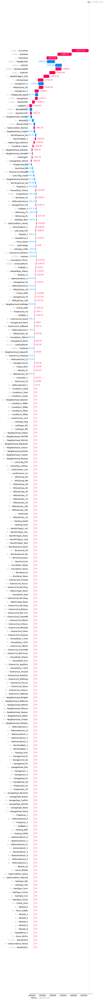

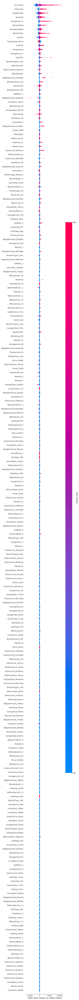

In [177]:
# 6. Create SHAP Explanation object with feature names
shap_explanation = shap.Explanation(
    values=shap_values_all[0],  # SHAP values for the first observation
    base_values=explainer.expected_value,  # Base value
    data=X_train_processed[0],  # Data for the first observation
    feature_names=features_list  # Assign correct feature names
)

# 7. Plot a waterfall chart for a single observation with feature names
shap.waterfall_plot(shap_explanation, max_display=400)
plt.show()

# 8. Plot feature importance for the entire test set with feature names
shap.summary_plot(shap_values_all, X_train_processed, feature_names=features_list, max_display=400)
plt.show()

In [178]:
pd.set_option('display.max_rows', None)

# Show feature importance
shap_importance = np.abs(shap_values_all).mean(axis=0)
feature_importance = pd.DataFrame(list(zip(features_list, shap_importance)),
                                  columns=['Feature', 'SHAP Importance'])

# Sort by importance
feature_importance = feature_importance.sort_values(by='SHAP Importance', ascending=False)

# Display
display(feature_importance)

,Feature,SHAP Importance
236,GrLivArea,15583.386335
0,ExterQual,7828.306666
232,TotalBsmtSF,6497.582704
243,YearBuilt,6487.287829
180,GarageCars_3,5046.672433
3,KitchenQual,4746.302785
244,YearRemodAdd,4357.558740
229,BsmtFinSF1,4299.699400
226,LotArea,3486.285500
166,FireplaceQu_None,3167.550860
